# Examine vegetation height from `Boreal ICESat-2` and external published maps  `

first run `code/maap_tools/notebooks/boreal_height_reference_clean.ipynb`

08 January 2025  
Paul Montesano, PhD

In [1]:
library(tidyverse)

library(sf)
library(fs)

library(viridis)
library(reshape2)

library(plyr)

library(rnaturalearth)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.0.4     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Linking to GEOS 3.12.1, GDAL 3.8.5, PROJ 9.4.0; sf_use_s2() is TRUE

Loading required package: viridisLite


Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths


------------------------------------------------------------------------------

You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)

----

In [2]:
source('/projects/code/3dsi/plot_functions.R') 

[1] "MAAP"


In [3]:
source('/projects/code/3dsi/boreal_map_functions.R') 
#source('/home/pmontesa/code/3dsi/boreal_map_functions.R') 


Attaching package: ‘rnaturalearthdata’


The following object is masked from ‘package:rnaturalearth’:

    countries110




[1] "MAAP"
[1] "MAAP"



Attaching package: ‘data.table’


The following objects are masked from ‘package:reshape2’:

    dcast, melt


The following objects are masked from ‘package:lubridate’:

    hour, isoweek, mday, minute, month, quarter, second, wday, week,
    yday, year


The following objects are masked from ‘package:dplyr’:

    between, first, last


The following object is masked from ‘package:purrr’:

    transpose



Attaching package: ‘scales’


The following object is masked from ‘package:viridis’:

    viridis_pal


The following object is masked from ‘package:purrr’:

    discard


The following object is masked from ‘package:readr’:

    col_factor




### linear model function

In [4]:
#source('/projects/code/3dsi/plot_functions.R')

lm_eqn_boreal_ht = function(df){
  y = df[, 'value']
  x = df[,'ref_ht']
  m = lm(y ~ x, df);
  
  eq <- substitute(italic(y) == a + b %.% italic(x)*","~~italic(r)^2~"="~r2, 
                   list(a = format(coef(m)[1], digits = 2), 
                        b = format(coef(m)[2], digits = 2), 
                        r2 = format(summary(m)$r.squared, digits = 3)))
  int = round(coef(m)[1], digits = 2)
  slope = round(coef(m)[2], digits = 2)
  # https://stackoverflow.com/questions/43123462/how-to-obtain-rmse-out-of-lm-result
  
  rss   <- c(crossprod(m$residuals))
  mse   <- rss / length(m$residuals)

  rmsd <- format(sqrt(mean((y-x)*(y-x))), dig=2)
  
  rmse  <- round(sqrt(mse),dig=2)
  sig2  <- round(rss / m$df.residual, dig=2) # Pearson estimated residual variance (as returned by summary.lm):
  n     <- nobs(m)
  paste('model n obs: ',n) 
  r2    <- round(summary(m)$r.squared, dig = 2)
  mae   <- round(mean(abs(m$residuals)), dig = 2)
  mape  <- round(mean(abs((m$residuals)/y))*100, dig=2)  #https://stats.stackexchange.com/questions/299712/what-are-the-shortcomings-of-the-mean-absolute-percentage-error-mape
  rrmse <- round(rmse / mean(x, na.rm = TRUE), dig=2) #https://www.rdocumentation.org/packages/ehaGoF/versions/0.1.1/topics/Goodness%20of%20fit%20-%20Relative%20Root%20Mean%20Square%20Error 
  
  #return(as.character(as.expression(eq)))
  #return(data.frame(cbind(int, slope, r2, rmse, sig2, n, mae, mape)))
  
  model_predictions = as.data.frame(cbind(df, data.frame("y_pred" = stats::predict(m))))
  model_stats = data.frame(cbind(int, slope, r2, rmsd, rmse, sig2, n, mae, mape, rrmse
                                #, as.character(as.expression(eq))
                                ) ) %>% mutate_if(is.character,as.numeric) 
  #return(list(model_stats, model_predictions))
    
  return(model_stats)
}

In [5]:
path_extracted = '/projects/my-private-bucket/reference/extracted'
path_extracted = '/explore/nobackup/people/pmontesa/userfs02/data/reference/extracted'
path_extracted = '/projects/my-public-bucket/databank/extract_from_points'

### Append variour columns to a single data frame

In [6]:
cols_base = c('IDX','source','continent','group_name','year','ref_ht','ref_ht_alpha')

In [7]:
NAME_STR = 'misc_v3.0_20260427'
df1 = st_read(path(path_extracted, paste0('boreal_height_val_plots_cleaned_',NAME_STR,'.gpkg')))
dim(df1)
cols_join_df1 = c('value_esawc2020','value_standage2020','value_tcc2020','value_tcctrend2020','value_ht_H30_2020_v2.0','value_ht_H30_2020_v2.1',
    'value_ht_S1H30_2020_v2.2','value_ht_H30_2019_v3.0','value_ht_H30_2020_v3.0','value_ht_H30_2021_v3.0','value_ht_H30_2022_v3.0',
    'value_ht_H30_2023_v3.0','value_ht_H30_2024_v3.0')

Reading layer `boreal_height_val_plots_cleaned_misc_v3.0__20260427' from data source `/projects/my-public-bucket/databank/extract_from_points/boreal_height_val_plots_cleaned_misc_v3.0_20260427.gpkg' 
  using driver `GPKG'
Simple feature collection with 1660 features and 42 fields
Geometry type: POINT
Dimension:     XY
Bounding box:  xmin: -134.7974 ymin: 42.15643 xmax: 168.714 ymax: 72.54884
Geodetic CRS:  WGS 84


[1] 1660   43

In [8]:
NAME_STR = 'multiyr_v3.1_20260427' # 20250615
df2 = st_read(path(path_extracted, paste0('boreal_height_val_plots_cleaned_',NAME_STR,'.gpkg')))
col_join_df2 = c('value_ht_H30_2016_v3.1_multiyr','value_ht_H30_2017_v3.1_multiyr','value_ht_H30_2018_v3.1_multiyr','value_ht_H30_2019_v3.1_multiyr','value_ht_H30_2020_v3.1_multiyr',
             'value_ht_H30_2021_v3.1_multiyr',
             'value_ht_H30_2022_v3.1_multiyr','value_ht_H30_2023_v3.1_multiyr','value_ht_H30_2024_v3.1_multiyr','value_ht_H30_2025_v3.1_multiyr')

Reading layer `boreal_height_val_plots_cleaned_multiyr_v3.1__20260427' from data source `/projects/my-public-bucket/databank/extract_from_points/boreal_height_val_plots_cleaned_multiyr_v3.1_20260427.gpkg' 
  using driver `GPKG'
Simple feature collection with 1578 features and 40 fields
Geometry type: POINT
Dimension:     XY
Bounding box:  xmin: -134.7974 ymin: 42.62225 xmax: 168.714 ymax: 72.54884
Geodetic CRS:  WGS 84


In [9]:
colnames(df2)

[1] "IDX"                                      
 [2] "source"                                   
 [3] "continent"                                
 [4] "group_name"                               
 [5] "year"                                     
 [6] "ref_ht"                                   
 [7] "ref_ht_alpha"                             
 [8] "value_ht_lang_2022_10m_p98"               
 [9] "value_ht_meta_alsgedi_global_v6_p50"      
[10] "value_ht_meta_alsgedi_global_v6_p95"      
[11] "value_ht_meta_alsgedi_global_v6_p98"      
[12] "value_ht_potapov_2021_30m_p95"            
[13] "value_ht_potapov_boreal_2021_30m_p95"     
[14] "value_ht_H30_2016_v3.1_multiyr"           
[15] "value_ht_H30_2017_v3.1_multiyr"           
[16] "value_ht_H30_2018_v3.1_multiyr"           
[17] "value_ht_H30_2019_v3.1_multiyr"           
[18] "value_ht_H30_2020_v3.1_multiyr"           
[19] "value_ht_H30_2021_v3.1_multiyr"           
[20] "value_ht_H30_2022_v3.1_multiyr"           
[21] "value_ht_H30_2023_v3.1_multiyr"           
[22] "value_ht_H30_2024_v3.1_multiyr"           
[23] "value_ht_H30_2025_v3.1_multiyr"           
[24] "diff_value_ht_lang_2022_10m_p98"          
[25] "diff_value_ht_meta_alsgedi_global_v6_p50" 
[26] "diff_value_ht_meta_alsgedi_global_v6_p95" 
[27] "diff_value_ht_meta_alsgedi_global_v6_p98" 
[28] "diff_value_ht_potapov_2021_30m_p95"       
[29] "diff_value_ht_potapov_boreal_2021_30m_p95"
[30] "diff_value_ht_H30_2016_v3.1_multiyr"      
[31] "diff_value_ht_H30_2017_v3.1_multiyr"      
[32] "diff_value_ht_H30_2018_v3.1_multiyr"      
[33] "diff_value_ht_H30_2019_v3.1_multiyr"      
[34] "diff_value_ht_H30_2020_v3.1_multiyr"      
[35] "diff_value_ht_H30_2021_v3.1_multiyr"      
[36] "diff_value_ht_H30_2022_v3.1_multiyr"      
[37] "diff_value_ht_H30_2023_v3.1_multiyr"      
[38] "diff_value_ht_H30_2024_v3.1_multiyr"      
[39] "diff_value_ht_H30_2025_v3.1_multiyr"      
[40] "region"                                   
[41] "geom"

## Join the files

In [10]:
# Join df2 to df1, bringing only cols_join from df1
val_plots_df = st_join(df1 %>% select(all_of(cols_base), all_of(cols_join_df1), geom), df2 %>% select(all_of(col_join_df2)))

In [11]:
colnames(val_plots_df)

[1] "IDX"                            "source"                        
 [3] "continent"                      "group_name"                    
 [5] "year"                           "ref_ht"                        
 [7] "ref_ht_alpha"                   "value_esawc2020"               
 [9] "value_standage2020"             "value_tcc2020"                 
[11] "value_tcctrend2020"             "value_ht_H30_2020_v2.0"        
[13] "value_ht_H30_2020_v2.1"         "value_ht_S1H30_2020_v2.2"      
[15] "value_ht_H30_2019_v3.0"         "value_ht_H30_2020_v3.0"        
[17] "value_ht_H30_2021_v3.0"         "value_ht_H30_2022_v3.0"        
[19] "value_ht_H30_2023_v3.0"         "value_ht_H30_2024_v3.0"        
[21] "value_ht_H30_2016_v3.1_multiyr" "value_ht_H30_2017_v3.1_multiyr"
[23] "value_ht_H30_2018_v3.1_multiyr" "value_ht_H30_2019_v3.1_multiyr"
[25] "value_ht_H30_2020_v3.1_multiyr" "value_ht_H30_2021_v3.1_multiyr"
[27] "value_ht_H30_2022_v3.1_multiyr" "value_ht_H30_2023_v3.1_multiyr"
[29] "value_ht_H30_2024_v3.1_multiyr" "value_ht_H30_2025_v3.1_multiyr"
[31] "geom"

In [12]:
dim(val_plots_df)

[1] 1666   31

### Add difference columns: height and year

In [13]:
#val_plots_df$year_rs = 2020 # SHOULD BE CHANGED NOW WITH TIME SERIES

In [144]:
IDVARS = c("IDX","ref_ht", "continent", "source","group_name", "year"
           #,"year_rs"
           #,"diff_yr","diff_ht"
           #, "value_esawc2020","value_standage2020" # sometimes these not available
           ,"geom")
#IDVARS = c("ref_ht", "continent", "source","group_name", "year","year_rs","diff_yr","diff_ht", "value_esawc2020","geom")

In [145]:
MEAS_VARS = colnames(val_plots_df %>% as.data.frame() %>% select(starts_with('value_ht')))

## Function to produce final melted DF
 + Filter for MAX YEAR DIFF
 + Boxplot timeline
 + Hexbinned scatterplot

In [146]:
theme_hex = list(
                geom_hex(),
                scale_fill_viridis(trans='log10', option='plasma'),
                geom_abline(),
                geom_smooth(method='lm', formula= y ~  x),
                coord_equal(),
                theme_bw(),
                labs(x = 'Reference forest height [m] (field plots)', y = 'Predicted forest height [m] (remote sensing)'),
                theme(
                    text = element_text(size=16),
                    strip.text = element_text(size=10),
                    axis.title = element_text(size=22)
                    )
    )

In [264]:
DO_FILT_MELT <- function(val_plots_df, MAX_DIFF_YR, IDVARS, MEAS_VARS, YEAR_RS_FILTER=NULL){
    
            df_filt = val_plots_df %>% 
                  filter(if_all(starts_with("diff_"), ~ is.na(.) | abs(.) <= MAX_DIFF_YR)) %>%
                  select(!starts_with("diff_"))
                
        
            print( paste("# of plots after max year diff filter = ", MAX_DIFF_YR, " : ", nrow(df_filt)) )
        
            # Melted DF
            val_plots_m = reshape2::melt(df_filt, 
                               id.vars = IDVARS, measure.vars = MEAS_VARS) %>% 
                            # Extract year_rs from variable name (format: value_ht_H30_<YYYY>*)
                            mutate(year_rs = as.numeric(str_extract(variable, "(?<=_)\\d{4}(?=.*$)"))) %>%
                            mutate(map_version = str_extract(variable, "(?<=\\d{4}_).*$")) %>%
                            mutate(region = case_match(
                                                continent, c('Eurasia') ~ 'Permafrost\nBoreal',
                                                           c('North America') ~ 'Boreal'
                            ) ) %>%
                            mutate(region = case_match( 
                                                group_name, 
                                                    c('West Siberian Plains', 'Bahkta River','Tunguska River','Tahe','Russian Far East') ~ 'Boreal', 
                                                   # (continent == 'North America' ~ 'Boreal') & (group_name != 'Atlantic Maritime' & group_name != 'Pacific Maritime' & group_name != 'Mixedwood Plains') ~ 'Boreal',
                                                    c('Atlantic Maritime','Pacific Maritime','Mixedwood Plains') ~ 'Temperate',
                                                .default = region               
                                              )
                                   ) %>% 
            mutate(diff_ht = value - ref_ht) %>%
            mutate(diff_yr = year_rs - as.numeric(year))

            # Apply YEAR_RS_FILTER if provided
            if(!is.null(YEAR_RS_FILTER)) {
                val_plots_m = val_plots_m %>% filter(year_rs %in% YEAR_RS_FILTER)
                print(paste("# of rows after year_rs filter (", paste(YEAR_RS_FILTER, collapse=", "), "): ", nrow(val_plots_m)))
            }
        
            # Boxplot timeline
            #
            p_box_region = ggplot(val_plots_m) +
                geom_boxplot(aes(y=diff_ht, x=diff_yr, fill=as.numeric(year), group=year), outlier.size=-1) +
                geom_hline(aes(yintercept=0), linetype='dashed') +
                geom_vline(aes(xintercept=0), linetype='dashed') +
            
                #scale_fill_viridis_d(option='plasma', name='Years difference\n[satellite-field]', guide=FALSE) +
                #scale_fill_viridis_c(option='plasma', name='Year of plot obs.') +
                scale_fill_viridis_c(option='plasma', name='Year of plot obs.', limits = c(1990, 2025)) +
                coord_cartesian(ylim=c(-15,15)) +
                labs(y='Difference (height, m)\n[satellite - field]', x='Difference (years) between observations\n[satellite - field]')+
                theme_bw() +
                facet_grid(. ~ variable)
        
            #print(p_box_region)
        
            # Drop na
            val_plots_m = val_plots_m |> drop_na()
            
            # Hex scatterplot
            #
            df_eq <- plyr::ddply(val_plots_m %>% 
                             select(all_of(IDVARS), value, variable, ref_ht, year, group_name, region, diff_yr, continent )
                             , .(variable, source), c("lm_eqn_boreal_ht") )
        
            htmax = 40
            label_text_sz = 4
            
            p_hex_scat = ggplot(val_plots_m, aes( x=ref_ht, y=value)) +
                theme_hex +
                list(        
                    geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax+5,label=paste("n =", n, sep='')), parse = FALSE, 
                               hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines")),
                    geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax,label=paste("R2 =", r2, sep='')), parse = FALSE, 
                               hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines")),
                    geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax-5,label=paste("RMSE =", rmse, " m", sep='')), parse = FALSE, 
                               hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines")),
                    geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax-10,label=paste("bias =", int, " m", sep='')), parse = FALSE, 
                               hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines"))
                     ) +
                facet_grid(source~variable)
        
            #print(p_hex_scat)
        
            return(list(val_plots_m, p_box_region, p_hex_scat))
}

In [265]:
options(repr.plot.width = 12, repr.plot.height = 3, repr.plot.res = 300)

In [266]:
MEAS_VARS

[1] "value_ht_H30_2020_v2.0"         "value_ht_H30_2020_v2.1"        
 [3] "value_ht_S1H30_2020_v2.2"       "value_ht_H30_2019_v3.0"        
 [5] "value_ht_H30_2020_v3.0"         "value_ht_H30_2021_v3.0"        
 [7] "value_ht_H30_2022_v3.0"         "value_ht_H30_2023_v3.0"        
 [9] "value_ht_H30_2024_v3.0"         "value_ht_H30_2016_v3.1_multiyr"
[11] "value_ht_H30_2017_v3.1_multiyr" "value_ht_H30_2018_v3.1_multiyr"
[13] "value_ht_H30_2019_v3.1_multiyr" "value_ht_H30_2020_v3.1_multiyr"
[15] "value_ht_H30_2021_v3.1_multiyr" "value_ht_H30_2022_v3.1_multiyr"
[17] "value_ht_H30_2023_v3.1_multiyr" "value_ht_H30_2024_v3.1_multiyr"
[19] "value_ht_H30_2025_v3.1_multiyr"

In [267]:
head(val_plots_df)

IDX source  continent group_name year ref_ht ref_ht_alpha value_esawc2020
1 1   Miesner Eurasia   Keperveem  2016 0      0            100            
2 2   Miesner Eurasia   Keperveem  2016 0      0             30            
3 3   Miesner Eurasia   Keperveem  2016 0      0            100            
4 4   Miesner Eurasia   Keperveem  2016 0      0            100            
5 5   Miesner Eurasia   Keperveem  2016 0      0            100            
6 6   Miesner Eurasia   Keperveem  2016 0      0            100            
  value_standage2020 value_tcc2020 geom                     ⋯
1 -1                  2            POINT (168.1842 67.3456) ⋯
2  0                  3            POINT (166.3933 65.9352) ⋯
3  0                  4            POINT (166.389 65.9365)  ⋯
4  0                  2            POINT (166.3906 65.9372) ⋯
5  0                  1            POINT (166.3577 65.9459) ⋯
6 -1                 NA            POINT (168.7096 67.7969) ⋯
  value_ht_H30_2017_v3.1_multiyr value_ht_H30_2018_v3.1_multiyr
1 2.18080473                     2.2772684                     
2 0.17879140                     1.2837698                     
3 0.08717767                     0.2242827                     
4 0.02403537                     0.3923199                     
5 1.46298993                     1.3845813                     
6 1.25657904                     1.0106342                     
  value_ht_H30_2019_v3.1_multiyr value_ht_H30_2020_v3.1_multiyr
1 2.04033971                     2.387587                      
2 0.21196574                     1.309322                      
3 0.07830276                     1.213841                      
4 0.01142374                     1.301727                      
5 1.35027623                     2.036749                      
6 1.07773757                     1.167498                      
  value_ht_H30_2021_v3.1_multiyr value_ht_H30_2022_v3.1_multiyr
1 2.01471782                     1.80683553                    
2 0.51759082                     0.54214036                    
3 0.08027248                     0.08344202                    
4 0.02798086                     0.02955070                    
5 1.29055250                     1.36268806                    
6 1.22715020                     1.01624429                    
  value_ht_H30_2023_v3.1_multiyr value_ht_H30_2024_v3.1_multiyr
1 1.96253848                     2.06379867                    
2 1.00919127                     0.59085137                    
3 0.06415372                     0.01465847                    
4 0.02733893                     0.09494445                    
5 2.02385664                     1.25821328                    
6 1.19167972                     1.08990216                    
  value_ht_H30_2025_v3.1_multiyr geom                    
1 1.98798108                     POINT (168.1842 67.3456)
2 0.44768193                     POINT (166.3933 65.9352)
3 0.08559703                     POINT (166.389 65.9365) 
4 0.01187163                     POINT (166.3906 65.9372)
5 1.38110900                     POINT (166.3577 65.9459)
6 0.92173940                     POINT (168.7096 67.7969)

In [268]:
MAX_DIFF_YR = 40
results = DO_FILT_MELT(val_plots_df, MAX_DIFF_YR, IDVARS, MEAS_VARS, YEAR_RS_FILTER = NULL)
val_plots_m = results[[1]]

[1] "# of plots after max year diff filter =  40  :  1666"


In [269]:
MAX_DIFF_YR = 20
results = DO_FILT_MELT(val_plots_df , MAX_DIFF_YR, IDVARS, MEAS_VARS, YEAR_RS_FILTER = NULL)
val_plots_m = results[[1]]

[1] "# of plots after max year diff filter =  20  :  1666"


Warning message:
“Removed 1534 rows containing non-finite outside the scale range
(`stat_boxplot()`).”


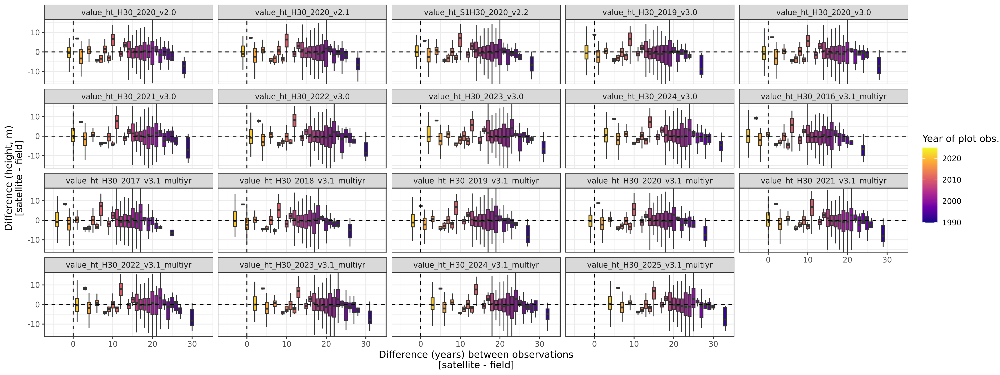

In [270]:
options(repr.plot.width = 16, repr.plot.height = 6, repr.plot.res = 300)
results[[2]] + facet_wrap(~variable)

Warning message:
“Removed 4 rows containing non-finite outside the scale range
(`stat_boxplot()`).”


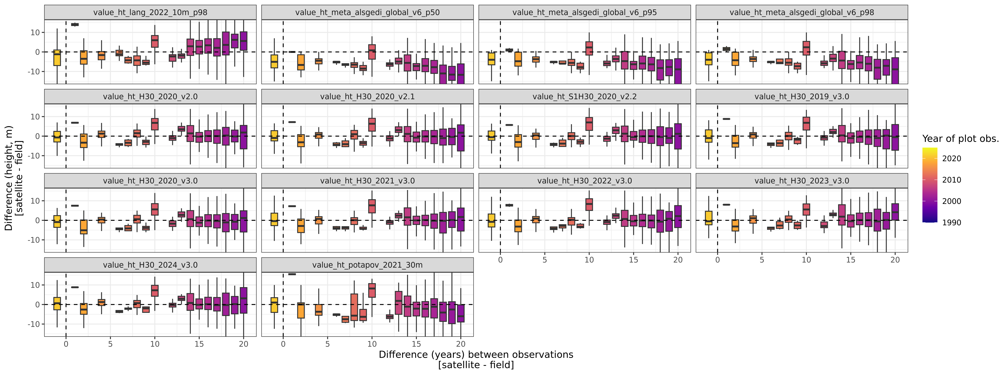

In [29]:
options(repr.plot.width = 16, repr.plot.height = 6, repr.plot.res = 300)
results[[2]] + facet_wrap(~variable)

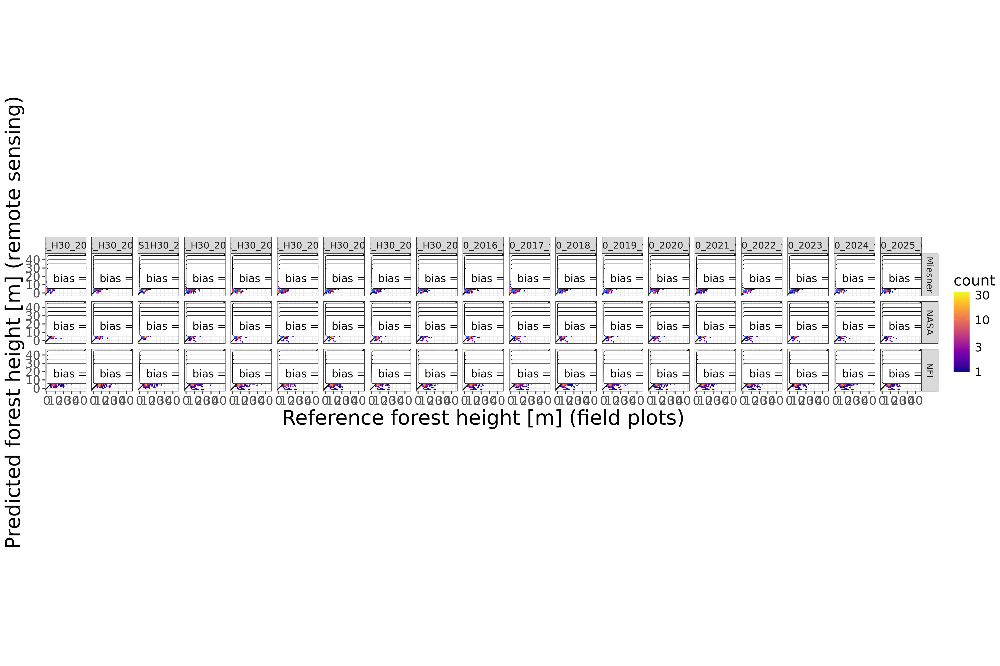

In [185]:
options(repr.plot.width = 15, repr.plot.height = 10)
results[[3]]

In [271]:
val_plots_m_final = val_plots_m |> filter(variable != 'value_ht_meta_alsgedi_global_v6_p50' & variable != 'value_ht_meta_alsgedi_global_v6_p95')

### Filter NA from value column

In [272]:
cols_look_for_na = c('value')

# Look  at where we still have NA in the 'value' column
df_na = val_plots_m |> filter((if_any(cols_look_for_na, ~ is.na(.x))) ) |> droplevels()
paste("# of remote sensing product heights values that are NA: ", nrow(df_na), " [source: ", levels(df_na$variable), "]")

[1] "# of remote sensing product heights values that are NA:  0  [source:   ]"

In [273]:
nrow(val_plots_m)
nrow(val_plots_m |> drop_na())

[1] 30120

[1] 30120

### Ok to drop_na() so scatterplotting works

In [274]:
val_plots_m = val_plots_m |> drop_na()

### Plot all datasets

In [ ]:
options(repr.plot.width = 22, repr.plot.height = 12)

df_eq <- plyr::ddply(val_plots_m %>% 
               select(all_of(IDVARS), value, variable, ref_ht, year, group_name, region, diff_yr, continent ),
                      .(variable, source), c("lm_eqn_boreal_ht") )
htmax = 40
label_text_sz = 4

ggplot(val_plots_m , aes( x=ref_ht, y=value)) +
    theme_hex +
    list(
        geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax+5,label=paste("n =", n, sep='')), parse = FALSE, 
                   hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines")),
        geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax,label=paste("R2 =", r2, sep='')), parse = FALSE, 
                   hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines")),
        geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax-5,label=paste("RMSE =", rmse, " m", sep='')), parse = FALSE, 
                   hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines")),
        geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax-10,label=paste("bias =", int, " m", sep='')), parse = FALSE, 
                   hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines"))
        ) +
    facet_grid(source~variable) 

### Final plot subset of datasets: filter down to only variables of interest

In [ ]:
val_plots_m_final = val_plots_m |> filter(variable != 'value_ht_meta_alsgedi_global_v6_p50' & variable != 'value_ht_meta_alsgedi_global_v6_p95')

In [ ]:
colnames(val_plots_m_final)

In [ ]:
options(repr.plot.width = 26, repr.plot.height = 14)

#tmp = val_plots_m_sub %>% filter(variable == 'value_ht_S1H30_2020')

df_eq <- plyr::ddply(val_plots_m_final %>% 
                     select(all_of(IDVARS), value, variable, ref_ht, year, group_name, region, diff_yr, continent )
                     , .(variable, source), c("lm_eqn_boreal_ht") )

htmax = 40
label_text_sz = 4

ggplot(val_plots_m_final, aes( x=ref_ht, y=value)) +
    theme_hex +
    list(        
        geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax+5,label=paste("n =", n, sep='')), parse = FALSE, 
                   hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines")),
        geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax,label=paste("R2 =", r2, sep='')), parse = FALSE, 
                   hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines")),
        geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax-5,label=paste("RMSE =", rmse, " m", sep='')), parse = FALSE, 
                   hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines")),
        geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax-10,label=paste("bias =", int, " m", sep='')), parse = FALSE, 
                   hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines"))
         ) +
    facet_grid(source~variable)

In [ ]:
options(repr.plot.width = 16, repr.plot.height = 8)

#tmp = val_plots_m_sub %>% filter(variable == 'value_ht_S1H30_2020')

df_eq <- plyr::ddply(val_plots_m_final %>% 
                     select(all_of(IDVARS), value, variable, ref_ht, year, group_name, region, diff_yr, continent )
                     , .(variable), c("lm_eqn_boreal_ht") )

htmax = 40
label_text_sz = 4

ggplot(val_plots_m_final, aes( x=ref_ht, y=value)) +
    theme_hex +
    list(        
        geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax+5,label=paste("n =", n, sep='')), parse = FALSE, 
                   hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines")),
        geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax,label=paste("R2 =", r2, sep='')), parse = FALSE, 
                   hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines")),
        geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax-5,label=paste("RMSE =", rmse, " m", sep='')), parse = FALSE, 
                   hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines")),
        geom_label(data=df_eq, mapping=aes(x = 0.1, y = htmax-10,label=paste("bias =", int, " m", sep='')), parse = FALSE, 
                   hjust="inward", vjust="inward", size=label_text_sz, color = "black", fill="white", label.padding=unit(0.5,"lines"))
         ) +
    facet_wrap(.~variable, ncol=6)

# Map plots with labels

In [ ]:
arc_root

#### Get some geo data for maps

In [41]:
#sib_rivers <- terra::vect(paste0(arc_root,'/siberia_rivers_v6.shp')) %>% st_as_sf()
sib_rivers <- st_read(paste0(arc_root,'/siberia_rivers_v6.shp')) %>% 
                                            mutate(centroid = st_centroid(geometry)) %>%
                                            mutate(lon_cent = st_coordinates(centroid)[,1], 
                                                   lat_cent = st_coordinates(centroid)[,2])%>%
                        mutate(continent = ifelse(lon_cent > -10, 'Eurasia', 'North America'))
#head(sib_rivers %>% as.data.frame())

Reading layer `siberia_rivers_v6' from data source 
  `/projects/my-public-bucket/databank/arc/siberia_rivers_v6.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 86 features and 13 fields
Geometry type: MULTILINESTRING
Dimension:     XY, XYZ
Bounding box:  xmin: 59.70167 ymin: 52.31647 xmax: 118.0107 ymax: 75.79348
z_range:       zmin: 0 zmax: 0
Geodetic CRS:  WGS 84


st_as_s2(): dropping Z and/or M coordinate



In [42]:
#lakes = st_read(paste0(arc_root, 'natural_earth/10m_physical/ne_10m_lakes.shp')) 
lakes = ne_download(scale = 'medium', type = 'lakes', category = 'physical', returnclass = "sf", ) #%>% 
                        #                     mutate(centroid = st_centroid(geometry)) #%>%
                        #                     mutate(lon_cent = st_coordinates(centroid)[,1], 
                        #                            lat_cent = st_coordinates(centroid)[,2]) %>%
                        # mutate(continent = ifelse(lon_cent > -10, 'Eurasia', 'North America'))

Reading layer `ne_50m_lakes' from data source `/tmp/RtmpfbdOfA/ne_50m_lakes.shp' using driver `ESRI Shapefile'
Simple feature collection with 412 features and 39 fields
Geometry type: POLYGON
Dimension:     XY
Bounding box:  xmin: -165.8985 ymin: -50.62002 xmax: 176.0827 ymax: 81.94033
Geodetic CRS:  WGS 84


In [43]:
riv = ne_download(scale = 'medium', type = 'rivers_lake_centerlines', category = 'physical', returnclass = "sf")

        
riv = st_read(riv_10m_fn) %>% 
                        mutate(centroid = st_centroid(geometry)) %>%
                        mutate(lon_cent = st_coordinates(centroid)[,1], 
                               lat_cent = st_coordinates(centroid)[,2]) %>%
                        mutate(continent = ifelse(lon_cent > -10, 'Eurasia', 'North America'))

Reading layer `ne_50m_rivers_lake_centerlines' from data source 
  `/tmp/RtmpfbdOfA/ne_50m_rivers_lake_centerlines.shp' using driver `ESRI Shapefile'
Simple feature collection with 478 features and 36 fields (with 1 geometry empty)
Geometry type: MULTILINESTRING
Dimension:     XY
Bounding box:  xmin: -165.2439 ymin: -50.24014 xmax: 176.3258 ymax: 73.3349
Geodetic CRS:  WGS 84
Reading layer `ne_10m_rivers_lake_centerlines' from data source 
  `/projects/my-public-bucket/databank/arc/natural_earth/10m_physical/ne_10m_rivers_lake_centerlines.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 1404 features and 7 fields
Geometry type: MULTILINESTRING
Dimension:     XY
Bounding box:  xmin: -164.9035 ymin: -52.15773 xmax: 177.2112 ymax: 75.79348
Geodetic CRS:  WGS 84


In [44]:
boreal = st_read(paste0(arc_root, '/wwf_circumboreal_Dissolve.gpkg')) %>% 
                        mutate(continent = ifelse(REALM == 'PA', 'Eurasia', 'North America'))

Reading layer `wwf_circumboreal_Dissolve' from data source 
  `/projects/my-public-bucket/databank/arc/wwf_circumboreal_Dissolve.gpkg' 
  using driver `GPKG'
Simple feature collection with 2 features and 4 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -5281040 ymin: -60527.9 xmax: 3959203 ymax: 8747447
Projected CRS: NAD83 / Alaska Albers


## Get the plots with extracted 30m Boreal Vegetation Height from ABoVE 
2020 from ICESat-2 v006, Copernicus GLO30, HLS H30  (& Sentinel-1)
this version of the map will be re-run with an updated global/local balance, but not likely to change much for the tiles associated with these plots

In [45]:
# # I need a better way of indicating version
# VAL_YEAR = 2020
# VERSION = 'ht_H30'
# VERSION_NUM = 'v2.0' #w/ moss/licen mask - just HLS
# VARS_RS = 'ICESat-2 ATL08 v6 | Copernicus GLO30 | HLS H30'
# TITLE_MAIN = paste0('Pixel-scale validation of predicted ',VERSION_NUM,' ',VAL_YEAR,' boreal vegetation height')
# #VAL_TYPE = 'value_ht_L30_2020'
# VAL_TYPE_1 = paste0('value_',VERSION,'_',VAL_YEAR)
# VAL_TYPE_1

In [46]:
# # I need a better way of indicating version
# VAL_YEAR = 2020
# VERSION = 'ht_S1H30'
# VERSION_NUM = 'v2.2' #w/0 moss/licen mask - HLS and S1
# VARS_RS = 'ICESat-2 ATL08 v6 | Copernicus GLO30 | HLS H30 | Sentinel-1'
# TITLE_MAIN = paste0('Pixel-scale validation of predicted ',VERSION_NUM,' ',VAL_YEAR,' boreal vegetation height')
# #VAL_TYPE = 'value_ht_L30_2020'
# VAL_TYPE_2 = paste0('value_',VERSION,'_',VAL_YEAR)
# VAL_TYPE_2

In [47]:
MAP_PLOTS <- function(val_plots_df, XLIMS, YLIMS, CONTINENT_LIST=c('North America','Eurasia','Europe','Asia'), MAP_VERSION=''){
    
    if(CONTINENT_LIST != 'None'){
        #val_plots_df = val_plots_df %>% filter(`continent` == CONTINENT)
        val_plots_df = val_plots_df %>% filter(`continent` %in% CONTINENT_LIST)
        }
    
    smry_plots_df = val_plots_df %>%
                #drop_na() %>%
                dplyr::group_by(group_name, year, continent) %>%
                dplyr::summarise(st_union(geom), n=n(), RMSD = sqrt(mean(diff_ht*diff_ht))) %>%
                st_centroid() %>%
                tidyr::unite("group_year", group_name:year, sep = ": ", remove = FALSE) %>% 
                tidyr::unite("group_year_n", c(group_year, n), sep = " ", remove = FALSE) %>% 
                st_jitter(0.5, factor = 0.2)
    
    worldmap = ne_countries(scale = 'medium', returnclass = 'sf') #%>% filter(continent %in% CONTINENT_LIST) %>% mutate(continent = ifelse(continent == 'North America','North America',ifelse(continent == 'Europe','Eurasia',ifelse(continent == 'Asia','Eurasia','other'))))
    
    basemaps_list = list(
        geom_sf(data=worldmap),
        geom_sf(data=boreal, alpha=0.5, fill='gray', color=NA),
        #geom_sf(data=sib_rivers, color='white', size=0.01), 
        geom_sf(data=riv, color='white', size=0.01),
        geom_sf(data=lakes, fill='white', color='white', size=0.01),
        geom_sf(data=worldmap, fill=NA, color='black', size=0.001)
        )
    maps_style_list = list(
        #scale_fill_viridis_d(option='plasma', name='Year of plot obs.',aesthetics = c("colour", "fill")),
        scale_fill_viridis_c(option='plasma', name='Decade of plot obs.',aesthetics = c("colour", "fill"), limits = c(1990, 2025), oob = scales::squish),
        scale_size_continuous(guide=FALSE),
        theme_bw(),
        guides(fill=guide_legend(title.position = "top", label.position = "bottom", legend.position='horizontal', nrow=1),
               color=guide_legend(title.position = "top", label.position = "bottom", legend.position='horizontal', nrow=1)),
        theme(text = element_text(size=16), legend.position = c(0.9, 0.85) ),
        theme(legend.background = element_rect(colour = 'black', fill = 'white', linetype='solid')),
        coord_sf(xlim = XLIMS, ylim = YLIMS, expand = FALSE),
        theme(legend.position="bottom"),
        labs(
            #title=paste0(CONTINENT, ' field validation plots'), 
            x=NULL, y=NULL, caption=paste0("Plots, n=", sum(smry_plots_df$n), ' | Version: ', MAP_VERSION)
        ) #,
        #facet_wrap(continent~.)
    )
       
    map_inset_region = ggplot() +
        list(geom_sf(data=worldmap),
        geom_sf(data=boreal, alpha=0.5, fill='gray', color=NA),
        geom_sf(data=worldmap, fill=NA, color='black', size=0.001)
             ) +
        geom_sf(data=val_plots_df %>% drop_na() , aes(color=region), size=0.25) +
        coord_sf(xlim = XLIMS, ylim = YLIMS, expand = FALSE) +
        scale_color_brewer(palette='Set1', name=NULL) +
        theme(
        axis.text = element_blank(),
        legend.position='bottom', 
        legend.direction='horizontal'
    )
    # #print(map_inset_region)
    
    map_plots_option1 = ggplot() + 
        basemaps_list +
        # # Size labels with n
        #geom_sf_label(data=smry_plots_df, aes(label=group_year, size=n), vjust=0, hjust=0, nudge_x = 1) + 
        geom_sf_label(data=smry_plots_df, aes(label=group_year), vjust=0, hjust=0, size=2, position=position_jitter(width=3,height=0)) + 
        # Option 1 for points
        geom_sf(data=val_plots_df %>% drop_na(), aes(color=factor(year)), shape=21, size=4) +
        geom_sf(data=val_plots_df %>% drop_na(), shape=19, size=1, alpha=0.1) +
        maps_style_list

    map_plots_option2 = ggplot() + 
        basemaps_list +
        # # Size labels with n
        #geom_sf_label(data=smry_plots_df, aes(label=group_year, size=n), vjust=0, hjust=0, nudge_x = 1) + 
        #geom_sf_label(data=smry_plots_df, aes(label=group_year), vjust=0, hjust=0, size=2, position=position_jitter(width=3,height=0)) + 
        # Option 2 for points
        geom_sf(data=val_plots_df %>% drop_na() , aes(fill=as.numeric(year)), shape=21, size=3, color='black') +
        maps_style_list
    
    map_plots_option3 = ggplot() + 
        basemaps_list +
        geom_sf(data=smry_plots_df, aes(fill=factor(year), size=n), shape=21, alpha=0.25, show.legend=TRUE) +
        maps_style_list +
        scale_size(range = c(10, 25))
    
    map_final = map_plots_option2 #+ inset_element(map_inset_region, left = 0, bottom = 0.0, right = 0.25, top = 0.25 ) & theme(panel.border = element_rect(colour = "black", fill=NA))

    #print(map_plots_option1)
    #print(map_plots_option2)
    #print(map_plots_option3)
    return(list(smry_plots_df, map_final))
    }

In [48]:
options(repr.plot.width = 12, repr.plot.height = 6)

XLIMS_EA = c(79, 180)
YLIMS_EA = c(47, 77)
r = MAP_PLOTS(val_plots_df, XLIMS_EA, YLIMS_EA, CONTINENT_LIST = c('Eurasia'), MAP_VERSION='')
m_eurasia = r[[2]]

`summarise()` has grouped output by 'group_name', 'year'. You can override
using the `.groups` argument.
Warning message:
“A numeric `legend.position` argument in `theme()` was deprecated in ggplot2
3.5.0.
ℹ Please use the `legend.position.inside` argument of `theme()` instead.”
Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


In [49]:
options(repr.plot.width = 12, repr.plot.height = 6)
XLIMS_NA = c(-150, -45)
YLIMS_NA = c(42, 73)
r = MAP_PLOTS(val_plots_df, XLIMS_NA, YLIMS_NA, CONTINENT_LIST=c('North America'))
m_northamerica = r[[2]]

`summarise()` has grouped output by 'group_name', 'year'. You can override
using the `.groups` argument.
Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


In [50]:
library(patchwork)

Warning message:
“The `guide` argument in `scale_*()` cannot be `FALSE`. This was deprecated in
ggplot2 3.3.4.
ℹ Please use "none" instead.”


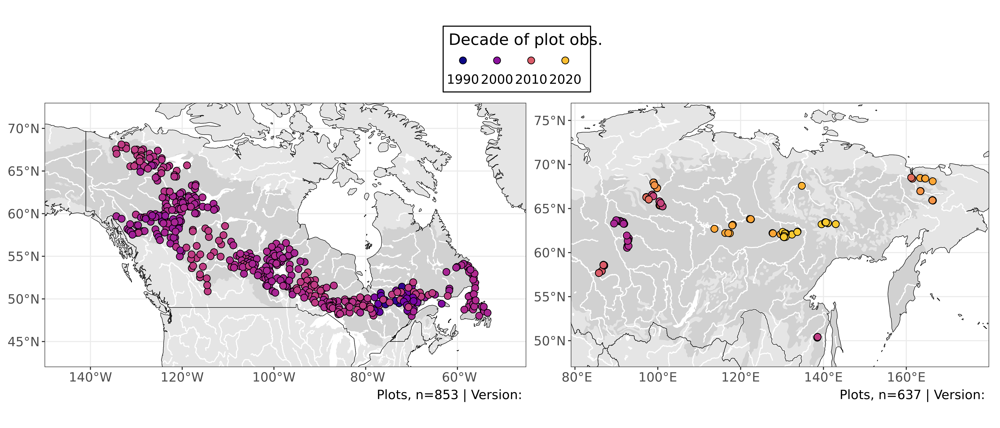

In [51]:
options(repr.plot.width = 14, repr.plot.height = 6)

maps_both = (m_northamerica + m_eurasia & theme(legend.position = 'top')) + plot_layout(guides = "collect")
maps_both

# Summarize: apply linear model by year, region, plot group name, and continent

Plot group name is either the field plot group (NASA, Meisner) or an ecozone (NFI)

### Plot group names
`Note`: some plot groups were collected over multiple years

In [52]:
#cols = c('int','slope','r2','rmsd','rmse','sig2','n','mae','mape','rrmse')

In [278]:
#print(levels(factor(val_plots_df$group_name)))
head(val_plots_m_final)

,IDX,ref_ht,continent,source,group_name,year,geom,variable,value,year_rs,map_version,region,diff_ht,diff_yr
,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<POINT [°]>,<fct>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>
1,2,0,Eurasia,Miesner,Keperveem,2016,POINT (166.3933 65.9352),value_ht_H30_2020_v2.0,6.757019,2020,v2.0,Permafrost Boreal,6.757019,4
2,11,0,Eurasia,Miesner,Keperveem,2016,POINT (168.714 67.82),value_ht_H30_2020_v2.0,1.237033,2020,v2.0,Permafrost Boreal,1.237033,4
3,13,0,Eurasia,Miesner,Keperveem,2016,POINT (168.7037 67.8048),value_ht_H30_2020_v2.0,2.630592,2020,v2.0,Permafrost Boreal,2.630592,4
4,14,0,Eurasia,Miesner,Keperveem,2016,POINT (168.6379 67.8002),value_ht_H30_2020_v2.0,2.984273,2020,v2.0,Permafrost Boreal,2.984273,4
5,15,0,Eurasia,Miesner,Keperveem,2016,POINT (168.6359 67.8026),value_ht_H30_2020_v2.0,4.446367,2020,v2.0,Permafrost Boreal,4.446367,4
6,21,0,Eurasia,Miesner,Keperveem,2016,POINT (168.6336 67.8091),value_ht_H30_2020_v2.0,4.697150,2020,v2.0,Permafrost Boreal,4.697150,4


## Linear model results by groups for a single remote sensing dataset

In [294]:
# df_eq_all <- plyr::ddply(val_plots_m_final %>%
#                             dplyr::select(variable, map_version, value, ref_ht, year, group_name, region, diff_yr, year_rs, continent )
#                    , .(variable, year_rs, map_version), c("lm_eqn_boreal_ht") )


In [298]:
df_eq_all <- plyr::ddply(val_plots_m_final %>%
                            dplyr::select(variable, map_version, value, ref_ht, year, group_name, region, diff_yr, year_rs, continent )
                   , .(variable, year_rs, map_version), c("lm_eqn_boreal_ht") ) %>%
                mutate(MAP_STR = variable) %>% 
                select(-variable)

df_eq_all_m = reshape2::melt(df_eq_all, id.vars = c('map_version','MAP_STR','year_rs'))

In [299]:
head(df_eq_all_m)

,map_version,MAP_STR,year_rs,variable,value
,<chr>,<fct>,<dbl>,<fct>,<dbl>
1,v2.0,value_ht_H30_2020_v2.0,2020,int,4.52
2,v2.1,value_ht_H30_2020_v2.1,2020,int,3.94
3,v2.2,value_ht_S1H30_2020_v2.2,2020,int,3.70
4,v3.0,value_ht_H30_2019_v3.0,2019,int,3.75
5,v3.0,value_ht_H30_2020_v3.0,2020,int,3.31
6,v3.0,value_ht_H30_2021_v3.0,2021,int,3.50


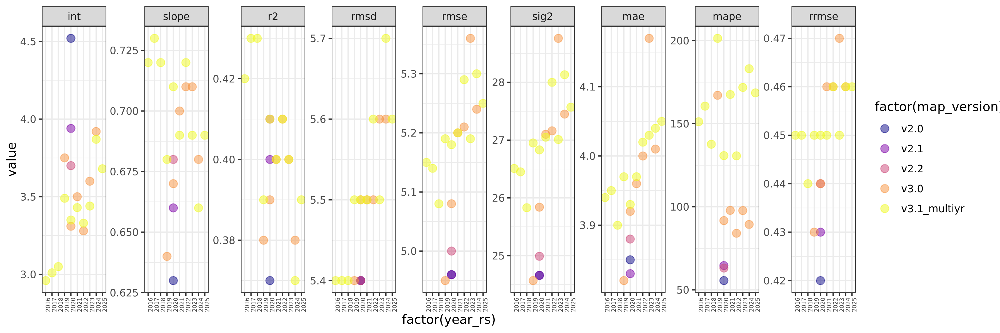

In [317]:
options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 300)

ggplot(df_eq_all_m %>% 
       filter(variable != 'n') #%>%
       #filter(contains("H30", ignore.case = FALSE))) +
       # filter(str_detect(MAP_VERSION, "v3.0")) #%>%
       # filter(!str_detect(variable, "ma")) %>%
       # filter(!str_detect(variable, "sig2"))
      ) +
    geom_point(aes(x=factor(year_rs), y=value, color=factor(map_version)), size=3, shape=19, alpha=0.5) +
    #scale_color_brewer(palette='plasma', direction=1) +
    scale_color_viridis_d(option = 'plasma', direction=1) +
    facet_wrap(.~variable
               , scales='free'
               , ncol=9) +
    theme_bw() +
    theme(axis.text.x = element_text(angle=90, size=5))

# Look at time-series of individual ground plots

In [319]:
val_plots_m_final_TIME_SERIES = val_plots_m_final %>% 
    filter(str_detect(map_version, "v3.")) %>%
    #separate(variable, into=c('junk','var','input','YEAR','version'), remove = FALSE) %>%
    #mutate(DIFF_YR_FINAL = as.numeric(YEAR) - as.numeric(year))
    mutate(DIFF_YR_FINAL = as.numeric(year_rs) - as.numeric(year))

In [320]:
head(val_plots_m_final_TIME_SERIES,3)

,IDX,ref_ht,continent,source,group_name,year,geom,variable,value,year_rs,map_version,region,diff_ht,diff_yr,DIFF_YR_FINAL
,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<POINT [°]>,<fct>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>
1,1,0,Eurasia,Miesner,Keperveem,2016,POINT (168.1842 67.3456),value_ht_H30_2019_v3.0,0.88431561,2019,v3.0,Permafrost Boreal,0.88431561,3,3
2,2,0,Eurasia,Miesner,Keperveem,2016,POINT (166.3933 65.9352),value_ht_H30_2019_v3.0,0.47009116,2019,v3.0,Permafrost Boreal,0.47009116,3,3
3,3,0,Eurasia,Miesner,Keperveem,2016,POINT (166.389 65.9365),value_ht_H30_2019_v3.0,0.03806332,2019,v3.0,Permafrost Boreal,0.03806332,3,3


## Plot stability: Summarize variation across time-series by plot

In [321]:
smry_val_plot_TIME_SERIES = val_plots_m_final_TIME_SERIES %>% 
    group_by(IDX, continent, source, group_name, region) %>% 
    dplyr::summarize(ht_mean = mean(value), ht_sd = sd(value))

`summarise()` has grouped output by 'IDX', 'continent', 'source', 'group_name'.
You can override using the `.groups` argument.


In [328]:
n_plots = nrow(smry_val_plot_TIME_SERIES)
n_plots

[1] 1598

#### Get list of plots with large std dev across time-series

In [323]:
CHANGE_PLOT_SD_THRESH = 3

In [324]:
plots_with_large_sd = smry_val_plot_TIME_SERIES[which(smry_val_plot_TIME_SERIES$ht_sd > CHANGE_PLOT_SD_THRESH),'IDX']
dim(plots_with_large_sd)
plots_with_large_sd$IDX

[1] 82  1

[1]  123  713  731  734  735  743  746  747  748  774  794  827  844  854  859
[16]  860  982 1086 1137 1139 1147 1149 1150 1159 1167 1180 1211 1217 1221 1222
[31] 1235 1241 1255 1261 1265 1266 1270 1275 1276 1281 1282 1283 1285 1286 1287
[46] 1289 1290 1292 1293 1295 1296 1301 1308 1311 1313 1321 1324 1331 1332 1337
[61] 1338 1341 1347 1355 1359 1363 1366 1390 1394 1407 1426 1499 1547 1567 1575
[76] 1593 1615 1623 1633 1634 1638 1639

In [325]:
val_plots_m_final_TIME_SERIES$time_series_change_class = ifelse(val_plots_m_final_TIME_SERIES$IDX %in% plots_with_large_sd$IDX, "unstable", "stable")
head(val_plots_m_final_TIME_SERIES)

,IDX,ref_ht,continent,source,group_name,year,geom,variable,value,year_rs,map_version,region,diff_ht,diff_yr,DIFF_YR_FINAL,time_series_change_class
,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<POINT [°]>,<fct>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>
1,1,0,Eurasia,Miesner,Keperveem,2016,POINT (168.1842 67.3456),value_ht_H30_2019_v3.0,0.88431561,2019,v3.0,Permafrost Boreal,0.88431561,3,3,stable
2,2,0,Eurasia,Miesner,Keperveem,2016,POINT (166.3933 65.9352),value_ht_H30_2019_v3.0,0.47009116,2019,v3.0,Permafrost Boreal,0.47009116,3,3,stable
3,3,0,Eurasia,Miesner,Keperveem,2016,POINT (166.389 65.9365),value_ht_H30_2019_v3.0,0.03806332,2019,v3.0,Permafrost Boreal,0.03806332,3,3,stable
4,4,0,Eurasia,Miesner,Keperveem,2016,POINT (166.3906 65.9372),value_ht_H30_2019_v3.0,0.13503531,2019,v3.0,Permafrost Boreal,0.13503531,3,3,stable
5,5,0,Eurasia,Miesner,Keperveem,2016,POINT (166.3577 65.9459),value_ht_H30_2019_v3.0,1.14837182,2019,v3.0,Permafrost Boreal,1.14837182,3,3,stable
6,6,0,Eurasia,Miesner,Keperveem,2016,POINT (168.7096 67.7969),value_ht_H30_2019_v3.0,0.59146607,2019,v3.0,Permafrost Boreal,0.59146607,3,3,stable


In [326]:
val_plots_change = val_plots_m_final_TIME_SERIES %>% filter(IDX %in% plots_with_large_sd$IDX)

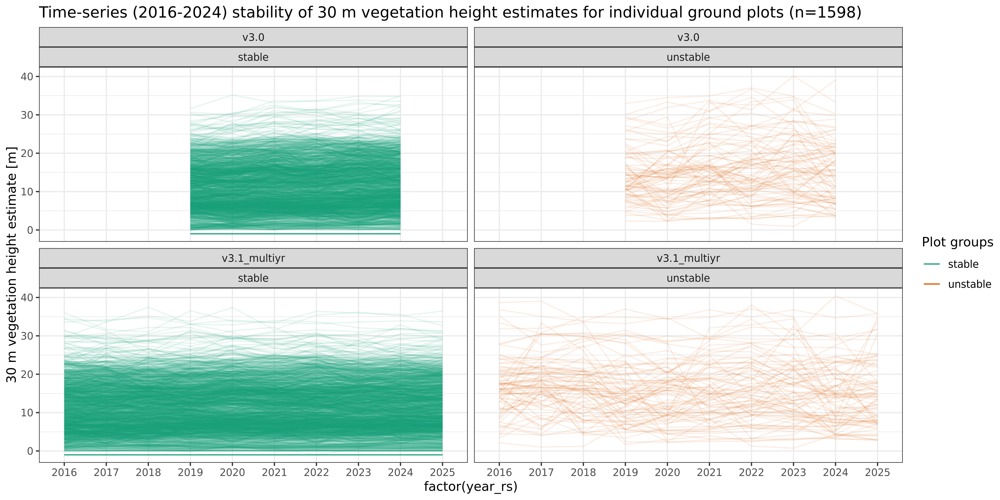

In [346]:
options(repr.plot.width = 12, repr.plot.height = 6, repr.plot.res = 300)

p_time_series = ggplot(val_plots_m_final_TIME_SERIES, aes(x=factor(year_rs), y=value, group=IDX, color=time_series_change_class)) +
    geom_path( alpha=0.1) +
    scale_color_brewer(palette='Dark2', name='Plot groups', direction=1) +
    #scale_color_viridis_d(option='mako', name='Plot groups') +
    #geom_line(data=data.frame(val_plots_change), aes(x=YEAR, y=value, group=IDX, color=group_name), color='black') +
    #facet_grid(region~continent) +
    facet_wrap(map_version~time_series_change_class) +
    labs(title=paste0('Time-series (2016-2024) stability of 30 m vegetation height estimates for individual ground plots (n=',n_plots,')'),
        y='30 m vegetation height estimate [m]') +
    guides(color=guide_legend(override.aes = list(alpha=1))) +
    theme_bw()
p_time_series

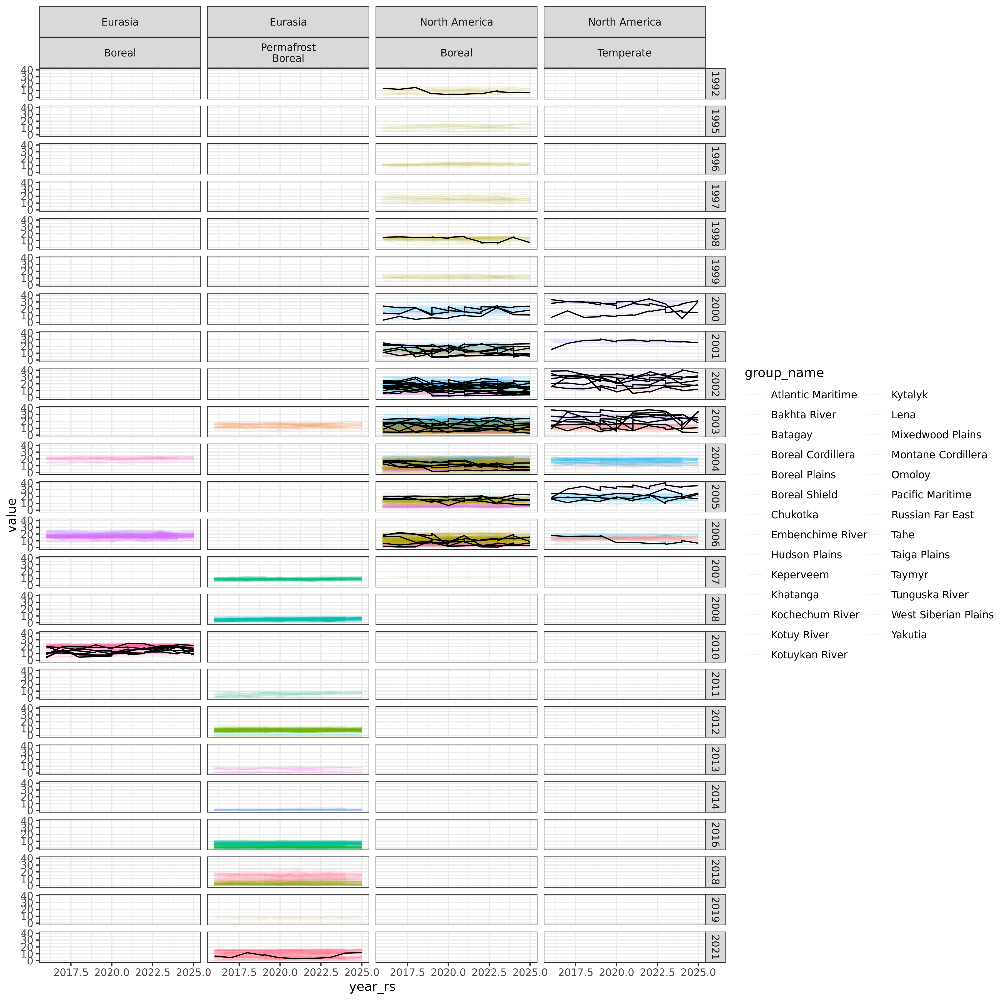

In [337]:
options(repr.plot.width = 12, repr.plot.height = 12, repr.plot.res = 300)

ggplot(val_plots_m_final_TIME_SERIES, aes(x=year_rs, y=value, group=IDX, color=group_name)) +
    geom_path( alpha=0.1) +
    geom_line(data=data.frame(val_plots_change), aes(x=year_rs, y=value, group=IDX, color=group_name), color='black') +
    facet_grid(year~continent+region) +
theme_bw()

In [344]:
options(repr.plot.width = 7, repr.plot.height = 3, repr.plot.res = 300)

p_hist_stability = ggplot(smry_val_plot_TIME_SERIES) +
    geom_histogram(aes(x=ht_sd, fill=interaction(region,continent))) +
    scale_fill_viridis_d(option='cividis', name=NULL) +
    geom_vline(xintercept=CHANGE_PLOT_SD_THRESH, linetype='dashed') +
    annotate(geom='text', x=CHANGE_PLOT_SD_THRESH, y=100, angle=90, label='stable\nunstable', size=3) +
    theme_bw() + 
    labs(title=paste0('Stability of 30 m height estimates at individual ground plots\n (n=',n_plots,') across time-series (2016-2024)'), 
                      x='standard deviation of vegetation height [m]', y='Number of ground plots')

In [342]:
library(patchwork)

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


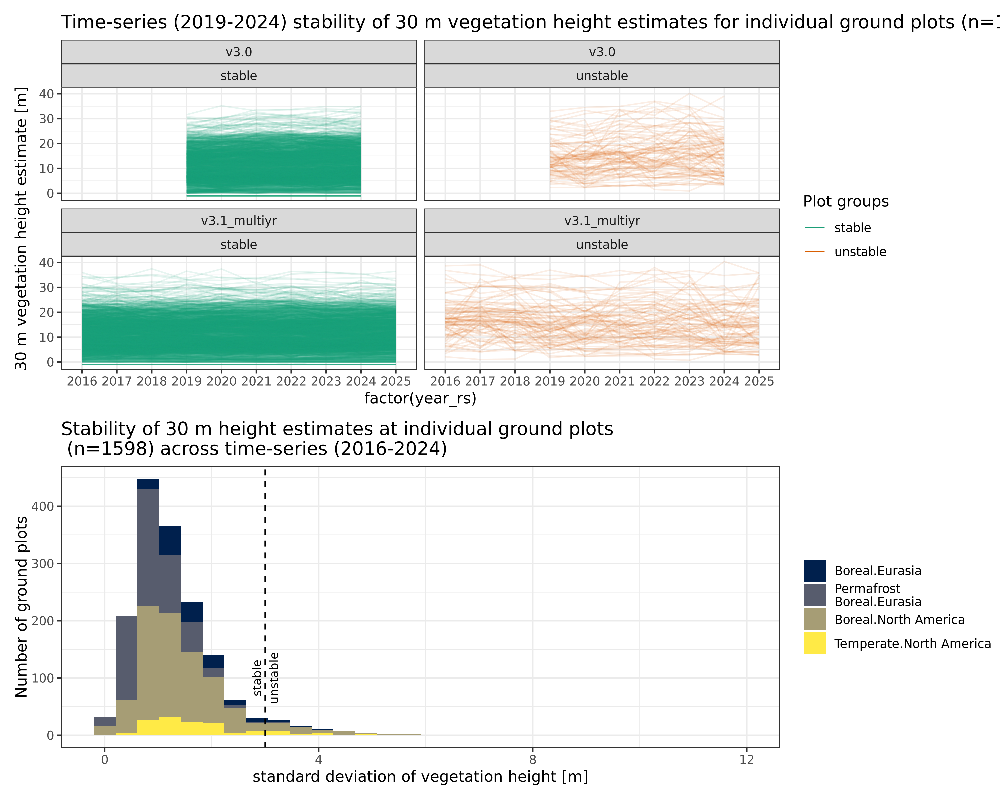

In [345]:
options(repr.plot.width = 10, repr.plot.height = 8, repr.plot.res = 300)

p_time_series / p_hist_stability

Reasons for "unstable" results could include:  
+ poor HLS composites
+ change across time series
+ ??

# Look at specific Map Version

In [64]:
VAL_YEAR = '2020'
VERSION_NUM = 'value_ht_H30_2020_v3.0'
VARS_RS = 'ICESat-2 ATL08 v6 | Copernicus GLO30 | HLS H30'
TITLE_MAIN = paste0('Pixel-scale validation of predicted ',VERSION_NUM,' ',VAL_YEAR,' boreal vegetation height')

In [65]:
val_plots_m_single = val_plots_m_final %>% 
                            #filter(diff_yr <= MAX_DIFF_YR) %>%
                            filter(variable == VERSION_NUM )

In [66]:
df_eq_single <- plyr::ddply(val_plots_m_single %>%
                            dplyr::select(variable, value, ref_ht, year, group_name, region, diff_yr, continent )
                   , .(variable), c("lm_eqn_boreal_ht") )
df_eq_single

variable,int,slope,r2,rmsd,rmse,sig2,n,mae,mape,rrmse
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
value_ht_H30_2020_v3.0,4.65,0.53,0.25,5.1,4.51,20.36,863,3.49,54.72,0.43


In [67]:
df_eq_region <- ddply(val_plots_m_single %>%
                        dplyr::select(variable, value, ref_ht, year, group_name, region, diff_yr, continent )
                      , .(variable, region, continent), c("lm_eqn_boreal_ht") )
df_eq_region

variable,region,continent,int,slope,r2,rmsd,rmse,sig2,n,mae,mape,rrmse
<fct>,<chr>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
value_ht_H30_2020_v3.0,Boreal,Eurasia,16.13,0.18,0.03,8.1,4.36,19.50,87,3.31,27.99,0.35
value_ht_H30_2020_v3.0,Boreal,North America,3.28,0.56,0.29,5.0,4.12,17.06,453,3.33,54.21,0.34
value_ht_H30_2020_v3.0,Permafrost Boreal,Eurasia,5.12,0.40,0.24,4.0,2.99,8.99,323,2.30,44.75,0.38


In [68]:
df_eq_region_year <- ddply(val_plots_m_single %>%
                            dplyr::select(variable, value, ref_ht, year, group_name, region, diff_yr, continent )
                           , .(year, region, continent), c("lm_eqn_boreal_ht") )
dim(df_eq_region_year)

[1] 18 13

In [69]:
# smry_df_eq_region = df_eq_region %>% group_by(continent) %>% dplyr::summarize(n_groups = n())
# smry_df_eq_region

# Distribution of RMSE from each 'diff_yr' model for 2 regions

#### Is this most useful? Maybe this shows usefulness of separating the faster growing `Other Boreal` plots from the `Permafrost Larch`


In [70]:
df_eq_region_year_group <- ddply(val_plots_m_single %>%
                            dplyr::select(variable, value, ref_ht, year, group_name, region, diff_yr, continent )
                            , .(variable, year, group_name, region, continent), c("lm_eqn_boreal_ht") )

#df_eq_region_year_group[,cols] <- lapply(df_eq_region_year_group[,cols], function(x) as.numeric(as.character(x)))

df_eq_region_year_group %>% dplyr::summarise(n=sum(n))
head(df_eq_region_year_group)

n
<dbl>
863


,variable,year,group_name,region,continent,int,slope,r2,rmsd,rmse,sig2,n,mae,mape,rrmse
,<fct>,<chr>,<chr>,<chr>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,value_ht_H30_2020_v3.0,2000,Taiga Plains,Boreal,North America,10.93,NA,0.00,2.0,0.00,NaN,1,0.00,0.00,0.00
2,value_ht_H30_2020_v3.0,2001,Boreal Cordillera,Boreal,North America,13.16,0.13,0.07,5.7,2.54,9.68,6,2.11,16.12,0.20
3,value_ht_H30_2020_v3.0,2001,Boreal Plains,Boreal,North America,48.86,-1.65,0.88,13.0,2.05,12.65,3,1.91,16.64,0.09
4,value_ht_H30_2020_v3.0,2001,Boreal Shield,Boreal,North America,37.10,-1.97,0.81,3.2,0.87,2.28,3,0.82,6.00,0.07
5,value_ht_H30_2020_v3.0,2001,Taiga Plains,Boreal,North America,-0.71,0.89,0.76,3.7,2.84,13.45,5,2.48,28.12,0.21
6,value_ht_H30_2020_v3.0,2002,Boreal Cordillera,Boreal,North America,6.91,0.44,0.52,4.0,2.40,7.65,8,1.82,16.49,0.18


In [71]:
smry_plot_groups = df_eq_region_year_group %>% 
                        group_by(variable, region, continent) %>% 
                        dplyr::summarise(n_groups = n())
smry_plot_groups

`summarise()` has grouped output by 'variable', 'region'. You can override
using the `.groups` argument.


variable,region,continent,n_groups
<fct>,<chr>,<fct>,<int>
value_ht_H30_2020_v3.0,Boreal,Eurasia,3
value_ht_H30_2020_v3.0,Boreal,North America,28
value_ht_H30_2020_v3.0,Permafrost Boreal,Eurasia,10


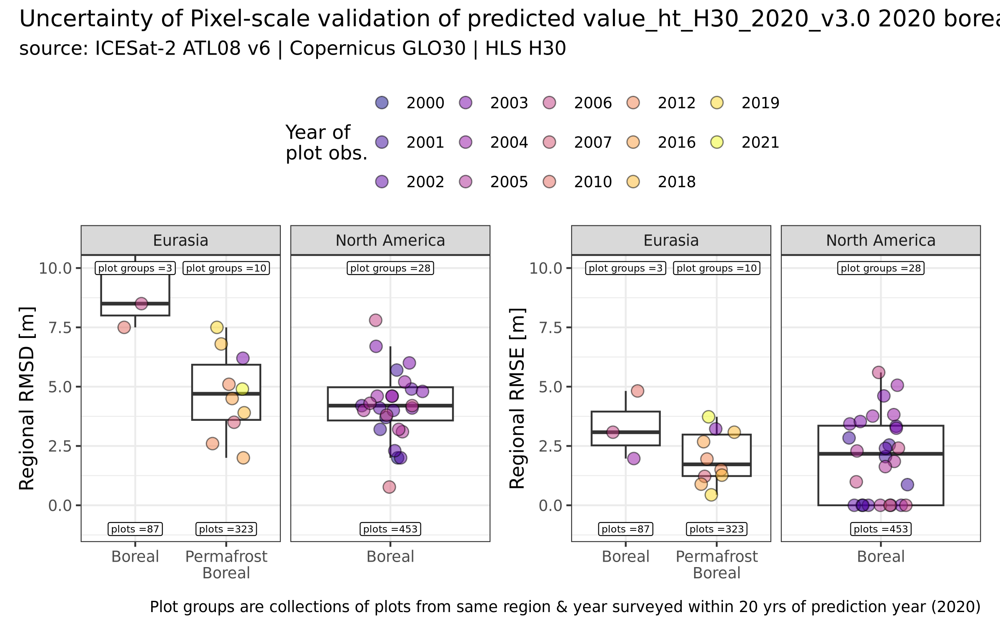

In [72]:
options(repr.plot.width = 8, repr.plot.height = 5, repr.plot.res = 300)
htmax = 10
geom_boxplot_list = list(
        geom_boxplot(outlier.shape = NA) ,
        geom_label(data=df_eq_region, aes(x=factor(region), y=-1, label=paste("plots =", n, sep='')), parse = FALSE, size=2, color = "black", fill="white", label.padding=unit(0.25,"lines") ),
        geom_label(data=smry_plot_groups, aes(x=factor(region), y=htmax, label=paste("plot groups =", n_groups, sep='')), parse = FALSE, size=2, color = "black", fill="white", label.padding=unit(0.25,"lines") ),
        geom_jitter(aes(fill=year),width=0.2, height=0, shape=21, color='black', size=3, alpha=0.5)
    )
geom_viz_list = list(
    #scale_color_viridis_c(option='plasma', name='Difference (years)\nbetween plot obs.\n[satellite-field]') ,
    scale_fill_viridis_d(option='plasma', name='Year of\nplot obs.') ,
    #scale_fill_viridis_d(option='plasma', name='Decade of plot obs.', limits = c(1990, 2025)) ,
    coord_cartesian(ylim=c(-1,htmax)),
    theme_bw() ,
    facet_wrap(~continent, scales='free_x')
    )

p_rmsd = ggplot(df_eq_region_year_group #%>% drop_na()
                , aes(x=region, y=rmsd)) + 
    geom_boxplot_list +
    #labs(y=paste('Regional RMSD\nPredicted ',VAL_YEAR,' Boreal Height [m]'), x=NULL) +
    labs(y='Regional RMSD [m]', x=NULL) +
    geom_viz_list

p_rmse = ggplot(df_eq_region_year_group #%>% drop_na()
                , aes(x=region, y=rmse)) + 
    geom_boxplot_list +
    #labs(y=paste('Regional RMSE\nPredicted ',VAL_YEAR,' Boreal Height [m]'), x=NULL) +
    labs(y='Regional RMSE [m]', x=NULL) +
    geom_viz_list +
    theme(     
        legend.position='bottom', 
        legend.direction='horizontal'
    )

(p_rmsd + p_rmse & theme(legend.position = 'top')) + plot_layout(guides = "collect") +  plot_annotation(
  title = paste0('Uncertainty of ', TITLE_MAIN),
  subtitle = paste0('source: ', VARS_RS),
  caption = paste0('Plot groups are collections of plots from same region & year surveyed within ', MAX_DIFF_YR, ' yrs of prediction year (',VAL_YEAR,')' )
)

# Region-level models
#### Given the distribution of 'diff_yr' models grouped by region, the region-level models show a better relationship at the 30m pixel level for the permafrost larch plots (that whose diff_yr is less important because of slow growth).

In [74]:
df_eq_region

variable,region,continent,int,slope,r2,rmsd,rmse,sig2,n,mae,mape,rrmse
<fct>,<chr>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
value_ht_H30_2020_v3.0,Boreal,Eurasia,16.13,0.18,0.03,8.1,4.36,19.50,87,3.31,27.99,0.35
value_ht_H30_2020_v3.0,Boreal,North America,3.28,0.56,0.29,5.0,4.12,17.06,453,3.33,54.21,0.34
value_ht_H30_2020_v3.0,Permafrost Boreal,Eurasia,5.12,0.40,0.24,4.0,2.99,8.99,323,2.30,44.75,0.38


In [75]:
df_eq_all

int,slope,r2,rmsd,rmse,sig2,n,mae,mape,rrmse,MAP_VERSION
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1.96,0.78,0.27,6.4,6.24,39.09,860,5.00,Inf,0.59,value_ht_lang_2022_10m_p98
-0.90,0.63,0.28,7.2,5.00,25.09,863,3.88,Inf,0.47,value_ht_meta_alsgedi_global_v6_p98
5.39,0.51,0.24,5.2,4.58,21.01,863,3.52,48.83,0.43,value_ht_H30_2020_v2.0
4.79,0.54,0.25,5.1,4.60,21.18,863,3.56,54.18,0.44,value_ht_H30_2020_v2.1
4.46,0.57,0.27,5.1,4.67,21.86,863,3.63,55.31,0.44,value_ht_S1H30_2020_v2.2
4.94,0.51,0.24,5.1,4.51,20.37,863,3.45,60.60,0.43,value_ht_H30_2019_v3.0
4.65,0.53,0.25,5.1,4.51,20.36,863,3.49,54.72,0.43,value_ht_H30_2020_v3.0
4.78,0.55,0.26,5.1,4.57,20.98,863,3.49,51.35,0.43,value_ht_H30_2021_v3.0
4.60,0.55,0.25,5.2,4.70,22.18,863,3.60,51.54,0.45,value_ht_H30_2022_v3.0


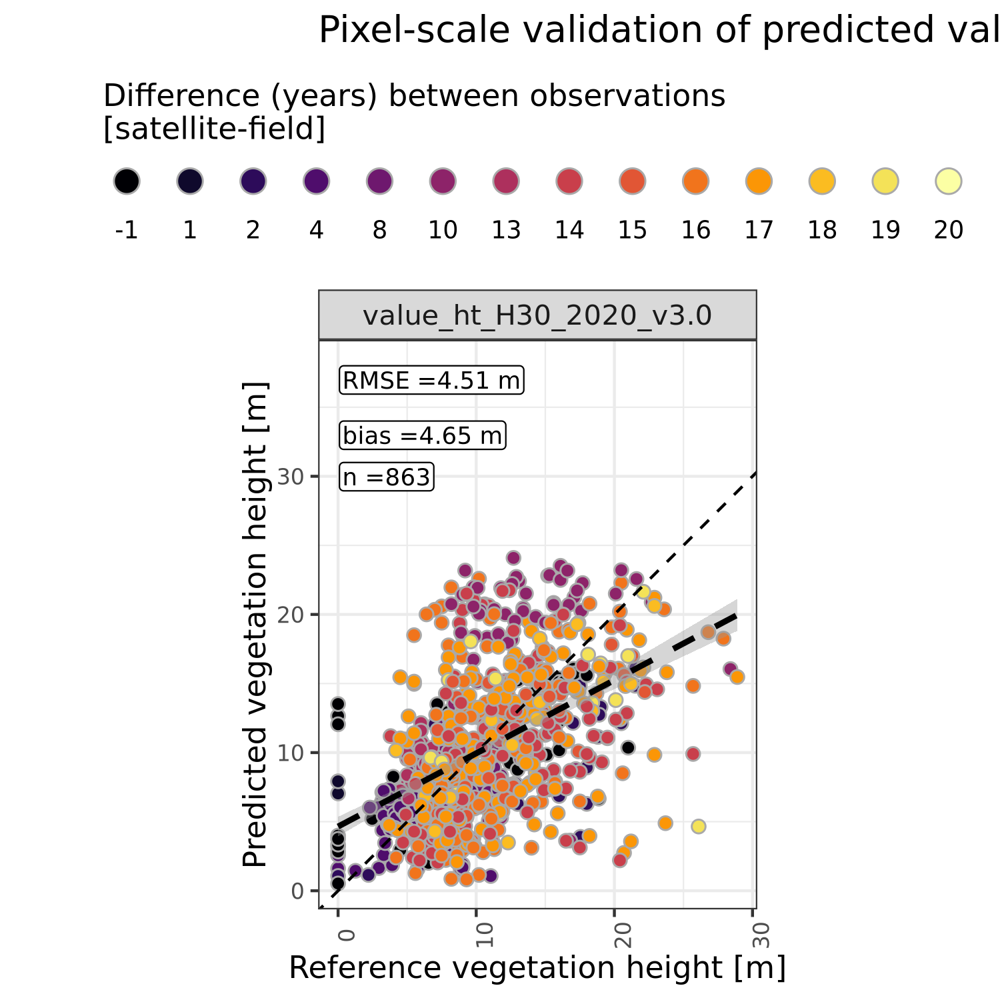

In [77]:
options(repr.plot.width = 5, repr.plot.height = 5, repr.plot.res = 300)

htmax = 40

p_scat_all = val_plots_m_single %>%
    ggplot(aes(x=as.numeric(ref_ht), y=as.numeric(value) )) + 
    geom_point(
        #aes(color=factor(value_esawc2020)), 
        aes(fill=factor(diff_yr)),
        size=2, alpha=1,
        shape=21,
        color='darkgrey'
    ) + 
    #scale_color_manual(values = c("#0072B2","#009E73","#D55E00")) +
    #scale_color_manual(values = col_pal, name='Land Cover Class') +
    scale_fill_viridis_d(option='inferno', name='Difference (years) between observations\n[satellite-field]') +
    geom_abline(linetype='dashed') +
    coord_equal() +
    theme_bw() +
    theme(axis.text.x=element_text(angle=90, size=8), axis.text.y = element_text(size=8), strip.text = element_text(size=7)) + 
    labs(x='Reference vegetation height [m]', y = 'Predicted vegetation height [m]', 
         #title='ABoVE Boreal Forest Height c.2020 (gridded, 30m)\nvalidation with boreal forest plots', subtitle='source: ICESat-2, Topography, & HLS L30') +
         #title='ABoVE Boreal Vegetation Height 2020 (gridded, 30m)\nvalidation with boreal forest plots', subtitle=paste0('source: ', VARS_RS)) +
         title=paste0(TITLE_MAIN)) +
    #facet_grid(region~continent)+
    #facet_wrap(.~continent+region, ncol=4)+
    #geom_label(data=df_eq_region, aes(x = 0.1, y = htmax,label=paste("r^2 ==", r2,sep='')), parse = TRUE, hjust="inward", vjust="inward", size=3, color = "black", fill="white", label.padding=unit(0.1,"lines"))+
    geom_label(data=df_eq_single, aes(x = 0.1, y = htmax-2,label=paste("RMSE =", rmse, " m", sep='')), parse = FALSE, hjust="inward", vjust="inward", size=3, color = "black", fill="white", label.padding=unit(0.1,"lines"))+
    geom_label(data=df_eq_single, aes(x = 0.1, y = htmax-6,label=paste("bias =", int, " m", sep='')),  parse = FALSE, hjust="inward", vjust="inward", size=3, color = "black", fill="white", label.padding=unit(0.1,"lines"))+
    geom_label(data=df_eq_single, aes(x = 0.1, y = htmax-9,label=paste("n =", n, sep='')),             parse = FALSE, hjust="inward", vjust="inward", size=3, color = "black", fill="white", label.padding=unit(0.1,"lines")) +
    guides(fill=guide_legend(override.aes = list(size = 4), title.position = "top", label.position = "bottom", legend.position='horizontal', nrow=1,
                                     #,keywidth = unit(.125, "cm"), keyheight = unit(1, "cm")
                                    )) +
    geom_smooth(method='lm', formula= y~x, color='black', linetype='dashed') +
    theme(legend.position='top', strip.text.x = element_text(size=10)) + 
facet_wrap(.~variable)

p_scat_all

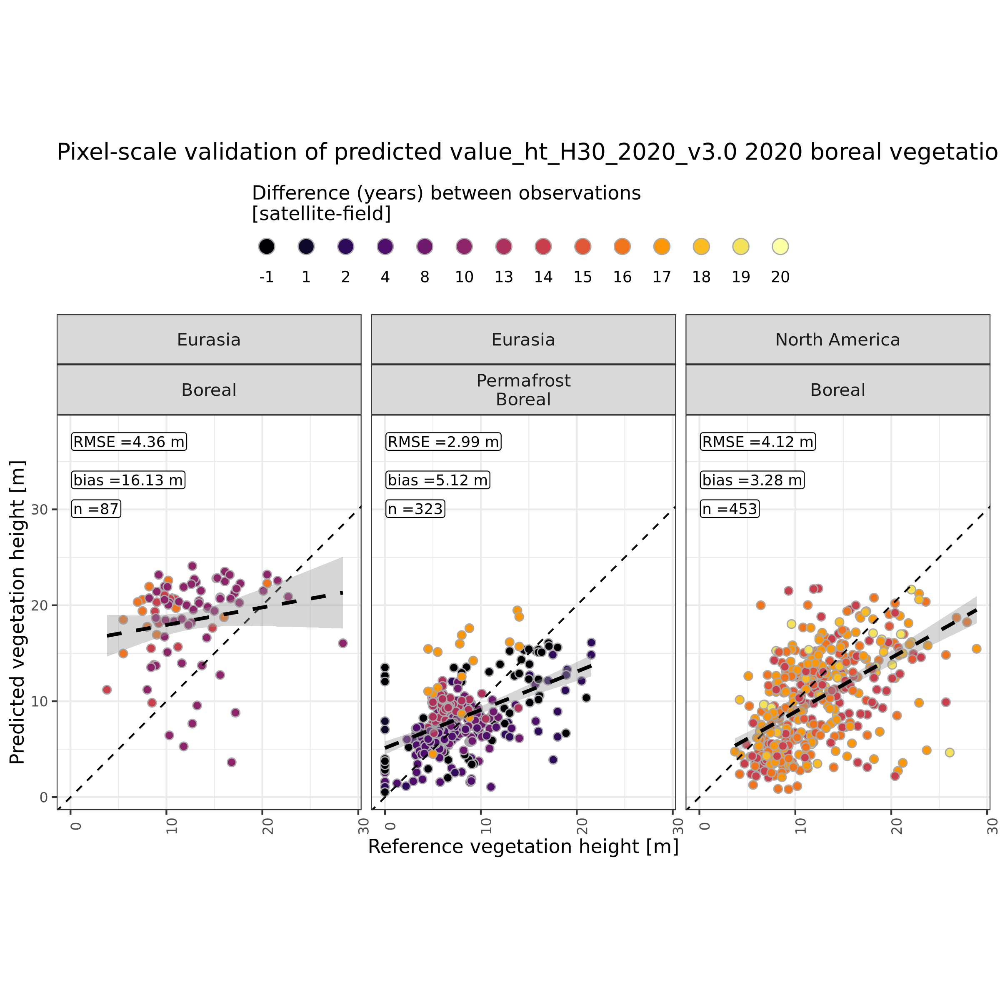

In [80]:
options(repr.plot.width = 8, repr.plot.height = 8, repr.plot.res = 300)

htmax = 40

p_scat_region = val_plots_m_single %>%
    ggplot(aes(x=as.numeric(ref_ht), y=as.numeric(value) )) + 
    geom_point(
        #aes(color=factor(value_esawc2020)), 
        aes(fill=factor(diff_yr)),
        size=2, alpha=1,
        shape=21,
        color='darkgrey'
    ) + 
    #scale_color_manual(values = c("#0072B2","#009E73","#D55E00")) +
    #scale_color_manual(values = col_pal, name='Land Cover Class') +
    scale_fill_viridis_d(option='inferno', name='Difference (years) between observations\n[satellite-field]') +
    geom_abline(linetype='dashed') +
    coord_equal() +
    theme_bw() +
    theme(axis.text.x=element_text(angle=90, size=8), axis.text.y = element_text(size=8), strip.text = element_text(size=7)) + 
    labs(x='Reference vegetation height [m]', y = 'Predicted vegetation height [m]', 
         #title='ABoVE Boreal Forest Height c.2020 (gridded, 30m)\nvalidation with boreal forest plots', subtitle='source: ICESat-2, Topography, & HLS L30') +
         #title='ABoVE Boreal Vegetation Height 2020 (gridded, 30m)\nvalidation with boreal forest plots', subtitle=paste0('source: ', VARS_RS)) +
         title=paste0(TITLE_MAIN)) +
    #facet_grid(region~continent)+
    facet_wrap(.~continent+region, ncol=4)+
    #geom_label(data=df_eq_region, aes(x = 0.1, y = htmax,label=paste("r^2 ==", r2,sep='')), parse = TRUE, hjust="inward", vjust="inward", size=3, color = "black", fill="white", label.padding=unit(0.1,"lines"))+
    geom_label(data=df_eq_region, aes(x = 0.1, y = htmax-2,label=paste("RMSE =", rmse, " m", sep='')), parse = FALSE, hjust="inward", vjust="inward", size=3, color = "black", fill="white", label.padding=unit(0.1,"lines"))+
    geom_label(data=df_eq_region, aes(x = 0.1, y = htmax-6,label=paste("bias =", int, " m", sep='')),  parse = FALSE, hjust="inward", vjust="inward", size=3, color = "black", fill="white", label.padding=unit(0.1,"lines"))+
    geom_label(data=df_eq_region, aes(x = 0.1, y = htmax-9,label=paste("n =", n, sep='')),             parse = FALSE, hjust="inward", vjust="inward", size=3, color = "black", fill="white", label.padding=unit(0.1,"lines")) +
    guides(fill=guide_legend(override.aes = list(size = 4), title.position = "top", label.position = "bottom", legend.position='horizontal', nrow=1,
                                     #,keywidth = unit(.125, "cm"), keyheight = unit(1, "cm")
                                    )) +
    geom_smooth(method='lm', formula= y~x, color='black', linetype='dashed') +
    theme(legend.position='top', strip.text.x = element_text(size=10))

p_scat_region

In [81]:
VAL_YEAR

[1] "2020"

In [82]:
options(repr.plot.width = 12, repr.plot.height = 10, repr.plot.res = 300)

htmax = 30

df_eq_region_group_FILT = df_eq_region_group %>% 
            filter(diff_yr < MAX_DIFF_YR) #%>% filter(continent == 'Eurasia')

p_scat = val_plots_df %>% 
    #filter(continent == 'Eurasia') %>% 
    filter(diff_yr < MAX_DIFF_YR) %>%
    #ggplot(aes(x=as.numeric(ref_ht), y=as.numeric(value_ht_H30_2020) )) + 
    ggplot(aes(x=as.numeric(ref_ht), y=.data[[VAL_TYPE]] )) + 
    geom_point(
        #aes(color=factor(value_esawc2020)), 
        aes(fill=factor(year)),
        size=2, shape=21, color='black') + 
    #scale_color_manual(values = c("#0072B2","#009E73","#D55E00")) +
    #scale_color_manual(values = col_pal, name='Land Cover Class') +
    #scale_fill_viridis_d(option='plasma', name='Difference (years) between observations\n[satellite-field]') +
    scale_fill_viridis_d(option='plasma', name='Year of plot obs.') +
    geom_abline(linetype='dashed') +
    coord_equal() +
    theme_bw() +
    theme(axis.text.x=element_text(angle=90, size=8), axis.text.y = element_text(size=8), strip.text = element_text(size=7)) + 
    labs(x='Reference Vegetation Height [m]', 
         #y = 'Predicted Boreal Forest Height (HLS L30 + Topo) [m]',
         y = 'Predicted Boreal Vegetation Height [m]',
         #title='Plot-level validation of ABoVE Boreal Forest Height (c2020 30m) from ICESat-2, Topography, & HLS L30', 
         title=paste0(TITLE_MAIN,' (',VAL_YEAR,', 30m)\nsource: ', VARS_RS), 
         subtitle=paste0('Boreal field plots measured within ', MAX_DIFF_YR, ' yrs of ',VAL_YEAR,' prediction')) +
    facet_wrap(year+group_name~., ncol=10)+
    #geom_label(data=df_eq, aes(x = 0.1, y = htmax,label=paste("r^2 ==", r2,sep='')), parse = TRUE, hjust="inward", vjust="inward", size=2, color = "black", fill="white", label.padding=unit(0.1,"lines"))+
    #geom_label(data=df_eq, aes(x = 0.1, y = htmax-3,label=paste("rmse ==", rmse,sep='')), parse = TRUE, hjust="inward", vjust="inward", size=2, color = "black", fill="white", label.padding=unit(0.1,"lines"))+
    #geom_label(data=df_eq, aes(x = 0.1, y = htmax-6,label=paste("bias ==", int,sep='')), parse = TRUE, hjust="inward", vjust="inward", size=2, color = "black", fill="white", label.padding=unit(0.1,"lines"))+
    #geom_label(data=df_eq, aes(x = 0.1, y = htmax-9,label=paste("slope ==", slope,sep='')),parse = TRUE, hjust="inward", vjust="inward", size=2, color = "black", fill="white", label.padding=unit(0.1,"lines")) +
    geom_label(data=df_eq_region_group_FILT #%>% filter(continent == 'Eurasia') 
               , aes(x = 0.1, y = htmax, label=paste("RMSD ==", round(rmsd, 2), "~m", sep=''), group=factor(year)), 
               parse = TRUE, hjust="inward", vjust="inward", size=3.5, color = "black", fill="white", alpha=0.5, label.size = NA, label.padding=unit(0.1,"lines")) +
    geom_label(data=df_eq_region_group_FILT #%>% filter(continent == 'Eurasia')
               , aes(x = 0.1, y = htmax-5, label=paste("rRMSD ==", round(rrmsd*100, 2), "~'%\'",  sep=''), group=factor(year)), 
               parse = TRUE, hjust="inward", vjust="inward", size=3.5, color = "black", fill="white", alpha=0.5, label.size = NA, label.padding=unit(0.1,"lines")) +
    geom_label(data=df_eq_region_group_FILT #%>% filter(continent == 'Eurasia')
               , aes(x = 0.1, y = htmax-10, label=paste("n ==", round(n, 2),  sep=''), group=factor(year)), 
               parse = TRUE, hjust="inward", vjust="inward", size=3.5, color = "black", fill="white", alpha=0.5, label.size = NA, label.padding=unit(0.1,"lines")) +
    guides(fill=guide_legend(override.aes = list(size = 4), title.position = "top", label.position = "bottom", legend.position='horizontal', nrow=1,
                                     #,keywidth = unit(.125, "cm"), keyheight = unit(1, "cm")
                                    )) +
    theme(legend.position='bottom', strip.text=element_text(size=10))
    #facet_wrap(.~interaction(factor(value_esawc2020), factor(year)), ncol=4)
    #facet_wrap(interaction(group_name, year)~.)

p_scat

ERROR: Error: object 'df_eq_region_group' not found


In [717]:
val_plots_df %>%
    st_write(dsn = '/projects/my-private-bucket/reference/val_plots.gpkg', layer = 'val_plots', append=FALSE)

Warning message in CPL_write_ogr(obj, dsn, layer, driver, as.character(dataset_options), :
“GDAL Error 4: sqlite3_open(/projects/my-private-bucket/reference/val_plots.gpkg) failed: unable to open database file”

Creating dataset /projects/my-private-bucket/reference/val_plots.gpkg failed.


ERROR: Error in CPL_write_ogr(obj, dsn, layer, driver, as.character(dataset_options), : Creation failed.



In [83]:
map_plots = maps_both 

In [84]:
options(repr.plot.width = 16, repr.plot.height = 12, repr.plot.res = 300)

# layout = "
# AAAAAABBBBB
# AAAAAABBBBB
# AAAAAACCCCD
# "

# figure = (p_scat_region + facet_wrap(continent~region, ncol=2))+
#     (map_plots + guides(fill="none") )+ p_box_region + p_rmse +
#     plot_layout(design = layout) +
#     plot_annotation(tag_levels = 'A',tag_prefix = '(', tag_sep = '', tag_suffix = ')') 

In [85]:
options(repr.plot.width = 8, repr.plot.height = 14, repr.plot.res = 300)

layout = "
AAAA
BBBB
CCDD
"

figure = (p_scat_region )+
    (map_plots + guides(fill="none") )+ p_box_region + p_rmse +
    plot_layout(design = layout) +
    plot_annotation(tag_levels = 'A',tag_prefix = '(', tag_sep = '', tag_suffix = ')') 

figure

ERROR: Error: object 'p_box_region' not found


In [221]:
# # Save
#   ggsave(plot = plot_lvis_gliht,
#            file = paste0(maindir,"//above_lidar_chk//", "plots_HT_validation_lvis_gliht_",ht_type,"_",facet_type,"_",RES,"m.png"), 
#          device = 'png', dpi = 300, width = 8, height = 5)